In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [7]:
cust_data = pd.read_csv("churn_data.csv")

## EDA

In [8]:
cust_data.head()

,user,churn,age,housing,credit_score,deposits,withdrawal,purchases_partners,purchases,cc_taken,...,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,zodiac_sign,left_for_two_month_plus,left_for_one_month,rewards_earned,reward_rate,is_referred
0,55409,0,37.0,na,NaN,0,0,0,0,0,...,0,0,0,0,Leo,1,0,NaN,0.00,0
1,23547,0,28.0,R,486.0,0,0,1,0,0,...,0,0,0,0,Leo,0,0,44.0,1.47,1
2,58313,0,35.0,R,561.0,47,2,86,47,0,...,0,0,0,0,Capricorn,1,0,65.0,2.17,0
3,8095,0,26.0,R,567.0,26,3,38,25,0,...,0,0,0,0,Capricorn,0,0,33.0,1.10,1
4,61353,1,27.0,na,NaN,0,0,2,0,0,...,0,0,0,0,Aries,1,0,1.0,0.03,0


In [9]:
cust_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27000 entries, 0 to 26999
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   user                     27000 non-null  int64  
 1   churn                    27000 non-null  int64  
 2   age                      26996 non-null  float64
 3   housing                  27000 non-null  object 
 4   credit_score             18969 non-null  float64
 5   deposits                 27000 non-null  int64  
 6   withdrawal               27000 non-null  int64  
 7   purchases_partners       27000 non-null  int64  
 8   purchases                27000 non-null  int64  
 9   cc_taken                 27000 non-null  int64  
 10  cc_recommended           27000 non-null  int64  
 11  cc_disliked              27000 non-null  int64  
 12  cc_liked                 27000 non-null  int64  
 13  cc_application_begin     27000 non-null  int64  
 14  app_downloaded        

In [10]:
cust_data.shape

(27000, 31)

In [11]:
cust_data.columns

Index(['user', 'churn', 'age', 'housing', 'credit_score', 'deposits',
       'withdrawal', 'purchases_partners', 'purchases', 'cc_taken',
       'cc_recommended', 'cc_disliked', 'cc_liked', 'cc_application_begin',
       'app_downloaded', 'web_user', 'app_web_user', 'ios_user',
       'android_user', 'registered_phones', 'payment_type', 'waiting_4_loan',
       'cancelled_loan', 'received_loan', 'rejected_loan', 'zodiac_sign',
       'left_for_two_month_plus', 'left_for_one_month', 'rewards_earned',
       'reward_rate', 'is_referred'],
      dtype='object')

In [12]:
cust_data.describe()

,user,churn,age,credit_score,deposits,withdrawal,purchases_partners,purchases,cc_taken,cc_recommended,...,registered_phones,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,left_for_two_month_plus,left_for_one_month,rewards_earned,reward_rate,is_referred
count,27000.000000,27000.000000,26996.000000,18969.000000,27000.000000,27000.000000,27000.000000,27000.000000,27000.000000,27000.000000,...,27000.000000,27000.000000,27000.000000,27000.000000,27000.000000,27000.000000,27000.000000,23773.000000,27000.000000,27000.000000
mean,35422.702519,0.413852,32.219921,542.944225,3.341556,0.307000,28.062519,3.273481,0.073778,92.625778,...,0.420926,0.001296,0.018815,0.018185,0.004889,0.173444,0.018074,29.110125,0.907684,0.318037
std,20321.006678,0.492532,9.964838,61.059315,9.131406,1.055416,42.219686,8.953077,0.437299,88.869343,...,0.912831,0.035981,0.135873,0.133623,0.069751,0.378638,0.133222,21.973478,0.752016,0.465723
min,1.000000,0.000000,17.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
25%,17810.500000,0.000000,25.000000,507.000000,0.000000,0.000000,0.000000,0.000000,0.000000,10.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,0.200000,0.000000
50%,35749.000000,0.000000,30.000000,542.000000,0.000000,0.000000,9.000000,0.000000,0.000000,65.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,25.000000,0.780000,0.000000
75%,53244.250000,1.000000,37.000000,578.000000,1.000000,0.000000,43.000000,1.000000,0.000000,164.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,48.000000,1.530000,1.000000
max,69658.000000,1.000000,91.000000,838.000000,65.000000,29.000000,1067.000000,63.000000,29.000000,522.000000,...,5.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,114.000000,4.000000,1.000000


In [13]:
# Unique values in churn columns
cust_data['churn'].value_counts()

0    15826
1    11174
Name: churn, dtype: int64

In [14]:
100*cust_data['churn'].value_counts()/len(cust_data['churn'])

0    58.614815
1    41.385185
Name: churn, dtype: float64

In [15]:
cust_data.isnull().sum()

user                          0
churn                         0
age                           4
housing                       0
credit_score               8031
deposits                      0
withdrawal                    0
purchases_partners            0
purchases                     0
cc_taken                      0
cc_recommended                0
cc_disliked                   0
cc_liked                      0
cc_application_begin          0
app_downloaded                0
web_user                      0
app_web_user                  0
ios_user                      0
android_user                  0
registered_phones             0
payment_type                  0
waiting_4_loan                0
cancelled_loan                0
received_loan                 0
rejected_loan                 0
zodiac_sign                   0
left_for_two_month_plus       0
left_for_one_month            0
rewards_earned             3227
reward_rate                   0
is_referred                   0
dtype: i

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


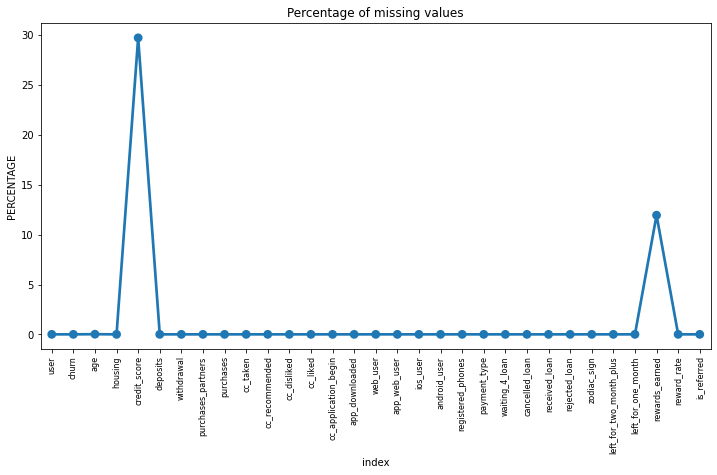

In [16]:
# Plot for the percentage of data missing
missing_data = pd.DataFrame((cust_data.isnull().sum())*100/cust_data.shape[0]).reset_index()
plt.figure(figsize=(12,6))
ax = sns.pointplot('index',0, data=missing_data)
plt.title('Percentage of missing values')
plt.ylabel("PERCENTAGE")
plt.xticks(rotation=90, fontsize=8);

In [17]:
cust_data

,user,churn,age,housing,credit_score,deposits,withdrawal,purchases_partners,purchases,cc_taken,...,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,zodiac_sign,left_for_two_month_plus,left_for_one_month,rewards_earned,reward_rate,is_referred
0,55409,0,37.0,na,NaN,0,0,0,0,0,...,0,0,0,0,Leo,1,0,NaN,0.00,0
1,23547,0,28.0,R,486.0,0,0,1,0,0,...,0,0,0,0,Leo,0,0,44.0,1.47,1
2,58313,0,35.0,R,561.0,47,2,86,47,0,...,0,0,0,0,Capricorn,1,0,65.0,2.17,0
3,8095,0,26.0,R,567.0,26,3,38,25,0,...,0,0,0,0,Capricorn,0,0,33.0,1.10,1
4,61353,1,27.0,na,NaN,0,0,2,0,0,...,0,0,0,0,Aries,1,0,1.0,0.03,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26995,24291,1,24.0,R,580.0,0,0,0,0,0,...,0,0,0,0,Leo,0,0,32.0,1.07,1
26996,4116,1,26.0,na,NaN,0,0,2,0,0,...,0,0,0,1,Cancer,1,0,2.0,0.67,0
26997,23740,0,22.0,na,NaN,0,0,37,0,0,...,0,0,0,0,Taurus,0,0,28.0,0.93,0
26998,47663,1,46.0,na,529.0,2,0,16,2,0,...,0,0,0,0,Aries,1,0,27.0,0.90,1


In [18]:
# As there are only 4 rows with null age value, we can remove them

cust_data = cust_data.dropna(subset=['age'])

In [19]:
# We can drop rewards_earned columns as many of its values are missing
cust_data = cust_data.drop(columns=['rewards_earned'], axis=1)

In [20]:
cust_data.head()

,user,churn,age,housing,credit_score,deposits,withdrawal,purchases_partners,purchases,cc_taken,...,payment_type,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,zodiac_sign,left_for_two_month_plus,left_for_one_month,reward_rate,is_referred
0,55409,0,37.0,na,NaN,0,0,0,0,0,...,Bi-Weekly,0,0,0,0,Leo,1,0,0.00,0
1,23547,0,28.0,R,486.0,0,0,1,0,0,...,Weekly,0,0,0,0,Leo,0,0,1.47,1
2,58313,0,35.0,R,561.0,47,2,86,47,0,...,Semi-Monthly,0,0,0,0,Capricorn,1,0,2.17,0
3,8095,0,26.0,R,567.0,26,3,38,25,0,...,Bi-Weekly,0,0,0,0,Capricorn,0,0,1.10,1
4,61353,1,27.0,na,NaN,0,0,2,0,0,...,Bi-Weekly,0,0,0,0,Aries,1,0,0.03,0


In [21]:
cust_data.isnull().sum()

user                          0
churn                         0
age                           0
housing                       0
credit_score               8027
deposits                      0
withdrawal                    0
purchases_partners            0
purchases                     0
cc_taken                      0
cc_recommended                0
cc_disliked                   0
cc_liked                      0
cc_application_begin          0
app_downloaded                0
web_user                      0
app_web_user                  0
ios_user                      0
android_user                  0
registered_phones             0
payment_type                  0
waiting_4_loan                0
cancelled_loan                0
received_loan                 0
rejected_loan                 0
zodiac_sign                   0
left_for_two_month_plus       0
left_for_one_month            0
reward_rate                   0
is_referred                   0
dtype: int64

In [22]:
cust_data.corr()

,user,churn,age,credit_score,deposits,withdrawal,purchases_partners,purchases,cc_taken,cc_recommended,...,android_user,registered_phones,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,left_for_two_month_plus,left_for_one_month,reward_rate,is_referred
user,1.000000,0.068663,-0.022443,-0.047770,-0.182143,-0.111446,-0.296324,-0.182230,-0.078437,-0.522829,...,-0.097284,-0.097917,0.015280,0.006195,-0.031182,0.025537,-0.026121,-0.029136,-0.489710,-0.164485
churn,0.068663,1.000000,-0.063206,-0.117781,-0.135381,-0.068543,-0.260784,-0.135921,0.058383,-0.198570,...,-0.036626,0.028578,-0.013558,0.035275,0.049960,0.056457,0.005094,0.036134,-0.167193,-0.083241
age,-0.022443,-0.063206,1.000000,0.044147,0.088757,0.044177,-0.000943,0.088769,0.077199,0.095860,...,-0.210068,-0.001354,0.004164,-0.003713,-0.001808,0.011030,-0.022500,0.034534,0.086167,-0.001557
credit_score,-0.047770,-0.117781,0.044147,1.000000,0.042217,0.003599,0.047121,0.043147,0.023657,0.121587,...,0.032767,-0.011358,0.020527,0.068690,0.092706,0.017313,0.011698,0.012985,0.147955,-0.034227
deposits,-0.182143,-0.135381,0.088757,0.042217,1.000000,0.488902,0.326588,0.998554,-0.047058,0.376123,...,-0.002171,0.040044,-0.002928,0.011381,-0.009439,-0.018501,0.048370,-0.011354,0.267635,0.229957
withdrawal,-0.111446,-0.068543,0.044177,0.003599,0.488902,1.000000,0.223692,0.488285,-0.040658,0.187423,...,-0.004248,0.047112,0.003173,-0.002577,-0.006240,-0.009826,0.032079,-0.009968,0.125363,0.211614
purchases_partners,-0.296324,-0.260784,-0.000943,0.047121,0.326588,0.223692,1.000000,0.326529,-0.101511,0.594491,...,0.048343,0.072166,0.000089,0.014012,-0.015040,-0.030989,0.082333,-0.032074,0.432839,0.301542
purchases,-0.182230,-0.135921,0.088769,0.043147,0.998554,0.488285,0.326529,1.000000,-0.047082,0.376666,...,-0.001371,0.039667,-0.002712,0.011687,-0.009273,-0.018337,0.048654,-0.011511,0.268124,0.230099
cc_taken,-0.078437,0.058383,0.077199,0.023657,-0.047058,-0.040658,-0.101511,-0.047082,1.000000,0.115100,...,-0.044865,0.042719,-0.006079,0.004685,0.046760,0.006387,-0.016006,0.085823,0.149156,-0.025004
cc_recommended,-0.522829,-0.198570,0.095860,0.121587,0.376123,0.187423,0.594491,0.376666,0.115100,1.000000,...,0.093413,0.125966,-0.018087,0.014188,0.044977,-0.037966,0.045625,0.037735,0.877549,0.241626


In [23]:
# As Credit score is important feature to decide the churn rate so we can't directly drop it.
# We will create a linear regression model to predict the missing values.
# We created CreditScore_Prediction file to do this task and it retuns the csv file we will use here with credit score predictions

new_data = pd.read_csv("credit_score_churn_data.csv")

In [24]:
new_data.head()

,user,churn,age,deposits,withdrawal,purchases_partners,purchases,cc_taken,cc_recommended,cc_disliked,...,left_for_one_month,reward_rate,is_referred,R,na,Monthly,Semi-Monthly,Weekly,na_payment_type,credit_score
0,23547,0,28.0,0,0,1,0,0,96,0,...,0,1.47,1,1,0,0,0,1,0,486.0
1,58313,0,35.0,47,2,86,47,0,285,0,...,0,2.17,0,1,0,0,1,0,0,561.0
2,8095,0,26.0,26,3,38,25,0,74,0,...,0,1.10,1,1,0,0,0,0,0,567.0
3,3120,1,32.0,5,3,111,5,0,227,0,...,0,1.83,0,1,0,0,0,0,0,567.0
4,41406,0,21.0,0,0,4,0,0,0,0,...,0,0.07,0,0,1,0,0,0,0,475.0


In [25]:
new_data.isnull().sum()

user                       0
churn                      0
age                        0
deposits                   0
withdrawal                 0
purchases_partners         0
purchases                  0
cc_taken                   0
cc_recommended             0
cc_disliked                0
cc_liked                   0
cc_application_begin       0
app_downloaded             0
web_user                   0
app_web_user               0
ios_user                   0
android_user               0
registered_phones          0
waiting_4_loan             0
cancelled_loan             0
received_loan              0
rejected_loan              0
left_for_two_month_plus    0
left_for_one_month         0
reward_rate                0
is_referred                0
R                          0
na                         0
Monthly                    0
Semi-Monthly               0
Weekly                     0
na_payment_type            0
credit_score               0
dtype: int64

In [26]:
new_data = new_data.drop(columns=['user'], axis=1)

In [27]:
new_data

,churn,age,deposits,withdrawal,purchases_partners,purchases,cc_taken,cc_recommended,cc_disliked,cc_liked,...,left_for_one_month,reward_rate,is_referred,R,na,Monthly,Semi-Monthly,Weekly,na_payment_type,credit_score
0,0,28.0,0,0,1,0,0,96,0,0,...,0,1.47,1,1,0,0,0,1,0,486.000000
1,0,35.0,47,2,86,47,0,285,0,0,...,0,2.17,0,1,0,0,1,0,0,561.000000
2,0,26.0,26,3,38,25,0,74,0,0,...,0,1.10,1,1,0,0,0,0,0,567.000000
3,1,32.0,5,3,111,5,0,227,0,0,...,0,1.83,0,1,0,0,0,0,0,567.000000
4,0,21.0,0,0,4,0,0,0,0,0,...,0,0.07,0,0,1,0,0,0,0,475.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26991,0,23.0,0,0,48,0,0,124,0,0,...,0,1.60,1,0,1,0,0,1,0,548.292360
26992,0,24.0,0,0,62,0,0,136,0,0,...,0,1.60,0,1,0,0,0,0,0,551.397825
26993,0,30.0,0,0,2,0,0,4,0,0,...,0,0.03,0,0,1,0,0,0,0,540.660274
26994,1,26.0,0,0,2,0,0,1,0,0,...,0,0.67,0,0,1,0,0,0,0,551.827785


In [28]:
#Group the age of customers in bins of 10 yrs
labels = ["{0} - {1}".format(i, i+10) for i in range(15,95,10)]
new_data['age_group'] = pd.cut(new_data.age, range(15,100,10),right=False, labels=labels)

In [29]:
new_data

,churn,age,deposits,withdrawal,purchases_partners,purchases,cc_taken,cc_recommended,cc_disliked,cc_liked,...,reward_rate,is_referred,R,na,Monthly,Semi-Monthly,Weekly,na_payment_type,credit_score,age_group
0,0,28.0,0,0,1,0,0,96,0,0,...,1.47,1,1,0,0,0,1,0,486.000000,25 - 35
1,0,35.0,47,2,86,47,0,285,0,0,...,2.17,0,1,0,0,1,0,0,561.000000,35 - 45
2,0,26.0,26,3,38,25,0,74,0,0,...,1.10,1,1,0,0,0,0,0,567.000000,25 - 35
3,1,32.0,5,3,111,5,0,227,0,0,...,1.83,0,1,0,0,0,0,0,567.000000,25 - 35
4,0,21.0,0,0,4,0,0,0,0,0,...,0.07,0,0,1,0,0,0,0,475.000000,15 - 25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26991,0,23.0,0,0,48,0,0,124,0,0,...,1.60,1,0,1,0,0,1,0,548.292360,15 - 25
26992,0,24.0,0,0,62,0,0,136,0,0,...,1.60,0,1,0,0,0,0,0,551.397825,15 - 25
26993,0,30.0,0,0,2,0,0,4,0,0,...,0.03,0,0,1,0,0,0,0,540.660274,25 - 35
26994,1,26.0,0,0,2,0,0,1,0,0,...,0.67,0,0,1,0,0,0,0,551.827785,25 - 35


In [30]:
new_data.corr()

,churn,age,deposits,withdrawal,purchases_partners,purchases,cc_taken,cc_recommended,cc_disliked,cc_liked,...,left_for_one_month,reward_rate,is_referred,R,na,Monthly,Semi-Monthly,Weekly,na_payment_type,credit_score
churn,1.000000,-0.063206,-0.135381,-0.068543,-0.260784,-0.135921,0.058383,-0.198570,0.009423,0.010886,...,0.036134,-0.167193,-0.083241,-0.044899,0.070693,-0.004130,-0.010896,0.048094,-0.017297,-0.134257
age,-0.063206,1.000000,0.088757,0.044177,-0.000943,0.088769,0.077199,0.095860,0.005577,0.019512,...,0.034534,0.086167,-0.001557,-0.049056,-0.010942,0.136957,0.002005,-0.053659,0.020553,0.050027
deposits,-0.135381,0.088757,1.000000,0.488902,0.326588,0.998554,-0.047058,0.376123,-0.014680,-0.012111,...,-0.011354,0.267635,0.229957,0.178694,-0.212659,-0.007661,0.002416,-0.003455,0.016332,0.049525
withdrawal,-0.068543,0.044177,0.488902,1.000000,0.223692,0.488285,-0.040658,0.187423,-0.011105,-0.003197,...,-0.009968,0.125363,0.211614,0.127624,-0.140041,0.006538,0.002218,-0.005921,0.018254,0.009143
purchases_partners,-0.260784,-0.000943,0.326588,0.223692,1.000000,0.326529,-0.101511,0.594491,-0.035335,-0.033016,...,-0.032074,0.432839,0.301542,0.212735,-0.250380,-0.012685,-0.010417,-0.003803,0.067019,0.060147
purchases,-0.135921,0.088769,0.998554,0.488285,0.326529,1.000000,-0.047082,0.376666,-0.014583,-0.012194,...,-0.011511,0.268124,0.230099,0.179118,-0.213093,-0.007760,0.002883,-0.002867,0.015780,0.050523
cc_taken,0.058383,0.077199,-0.047058,-0.040658,-0.101511,-0.047082,1.000000,0.115100,0.182655,0.168530,...,0.085823,0.149156,-0.025004,0.069089,-0.092260,-0.004830,0.002668,0.017442,0.002481,0.028296
cc_recommended,-0.198570,0.095860,0.376123,0.187423,0.594491,0.376666,0.115100,1.000000,0.048076,0.055571,...,0.037735,0.877549,0.241626,0.349188,-0.417533,-0.033961,0.003987,0.010353,0.048576,0.135400
cc_disliked,0.009423,0.005577,-0.014680,-0.011105,-0.035335,-0.014583,0.182655,0.048076,1.000000,0.095500,...,0.033594,0.060708,-0.009285,0.032851,-0.034668,-0.004495,-0.003040,0.002804,0.022319,0.015578
cc_liked,0.010886,0.019512,-0.012111,-0.003197,-0.033016,-0.012194,0.168530,0.055571,0.095500,1.000000,...,0.007706,0.064473,-0.012215,0.029185,-0.035378,-0.007743,-0.002703,0.005739,0.016756,0.028771


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

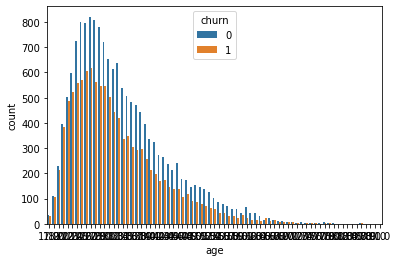

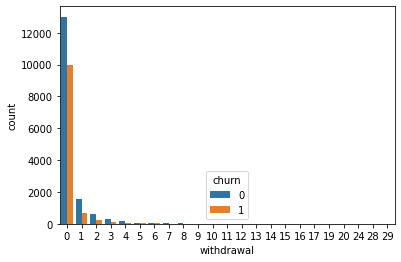

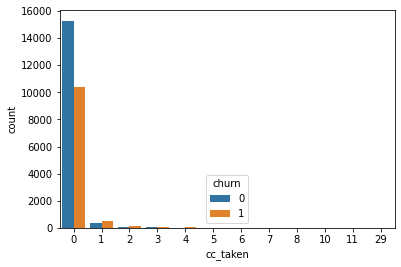

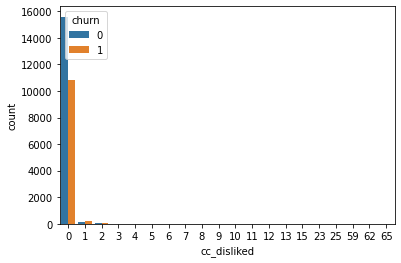

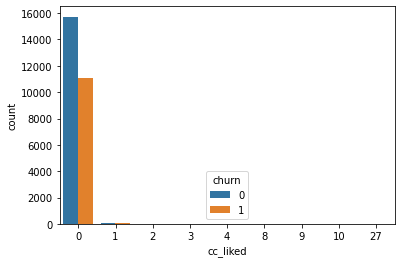

...

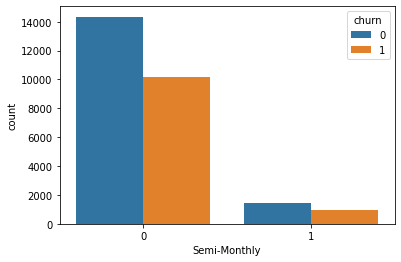

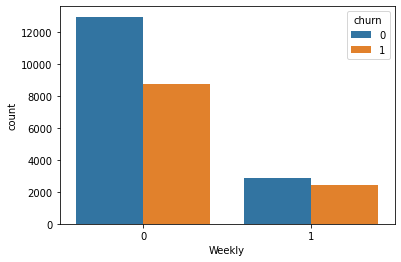

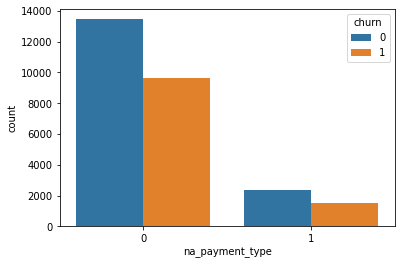

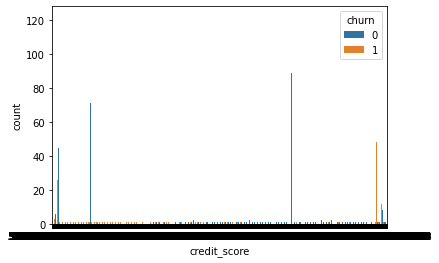

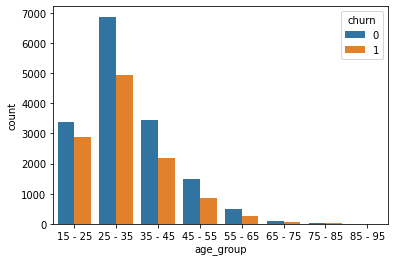

In [31]:
for i, pred in enumerate(new_data.drop(columns=['churn','reward_rate','cc_application_begin','cc_recommended','purchases','purchases_partners','deposits'])):
    plt.figure(i)
    sns.countplot(data=new_data, x=pred, hue='churn')
    

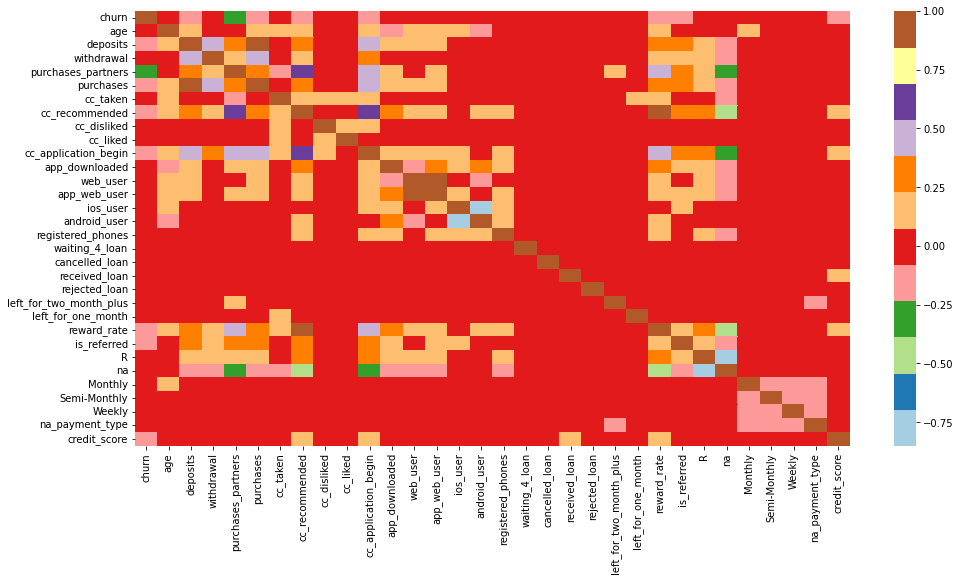

In [32]:
plt.figure(figsize=(16,8))
sns.heatmap(new_data.corr(),cmap="Paired")

In [33]:
new_data.drop(columns=['age_group'],axis=1,inplace=True)

In [34]:
X = new_data.drop('churn', axis=1)

In [35]:
X

,age,deposits,withdrawal,purchases_partners,purchases,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,...,left_for_one_month,reward_rate,is_referred,R,na,Monthly,Semi-Monthly,Weekly,na_payment_type,credit_score
0,28.0,0,0,1,0,0,96,0,0,5,...,0,1.47,1,1,0,0,0,1,0,486.000000
1,35.0,47,2,86,47,0,285,0,0,9,...,0,2.17,0,1,0,0,1,0,0,561.000000
2,26.0,26,3,38,25,0,74,0,0,26,...,0,1.10,1,1,0,0,0,0,0,567.000000
3,32.0,5,3,111,5,0,227,0,0,17,...,0,1.83,0,1,0,0,0,0,0,567.000000
4,21.0,0,0,4,0,0,0,0,0,0,...,0,0.07,0,0,1,0,0,0,0,475.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26991,23.0,0,0,48,0,0,124,0,0,2,...,0,1.60,1,0,1,0,0,1,0,548.292360
26992,24.0,0,0,62,0,0,136,0,0,3,...,0,1.60,0,1,0,0,0,0,0,551.397825
26993,30.0,0,0,2,0,0,4,0,0,0,...,0,0.03,0,0,1,0,0,0,0,540.660274
26994,26.0,0,0,2,0,0,1,0,0,0,...,0,0.67,0,0,1,0,0,0,0,551.827785


In [36]:
y = new_data['churn']

In [37]:
y

0        0
1        0
2        0
3        1
4        0
        ..
26991    0
26992    0
26993    0
26994    1
26995    0
Name: churn, Length: 26996, dtype: int64

In [38]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=48)

In [39]:
X_train.shape

(21596, 31)

In [40]:
X_test.shape

(5400, 31)

In [41]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_Xtrain = scaler.fit_transform(X_train)
scaled_Xtest = scaler.transform(X_test)

In [42]:
scaled_df = pd.DataFrame(data = scaled_Xtrain, columns=X.columns)

In [43]:
scaled_df

,age,deposits,withdrawal,purchases_partners,purchases,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,...,left_for_one_month,reward_rate,is_referred,R,na,Monthly,Semi-Monthly,Weekly,na_payment_type,credit_score
0,-0.018969,-0.365732,-0.285700,-0.661927,-0.365366,-0.166552,-0.164842,-0.055672,-0.052899,-0.255293,...,-0.135436,0.787379,-0.682587,-0.826744,0.972322,-0.331306,-0.315406,-0.496220,-0.411166,-0.675954
1,-0.420393,0.737358,9.795976,-0.307919,0.759943,-0.166552,-0.603510,-0.055672,-0.052899,1.637361,...,-0.135436,0.309448,1.465015,1.209565,-1.028466,-0.331306,-0.315406,-0.496220,-0.411166,-0.316214
2,-0.119325,-0.365732,-0.285700,2.783747,-0.365366,-0.166552,0.498783,-0.055672,-0.052899,0.217871,...,-0.135436,0.428930,1.465015,-0.826744,-1.028466,-0.331306,-0.315406,2.015234,-0.411166,0.078643
3,1.285659,5.370333,-0.285700,0.612501,4.923588,-0.166552,1.612325,-0.055672,-0.052899,0.454453,...,-0.135436,0.389103,1.465015,1.209565,-1.028466,-0.331306,-0.315406,-0.496220,-0.411166,-1.411203
4,-1.323597,-0.255423,-0.285700,0.494498,-0.252835,-0.166552,0.161347,-0.055672,-0.052899,0.454453,...,-0.135436,-0.181759,1.465015,1.209565,-1.028466,-0.331306,-0.315406,2.015234,-0.411166,-0.211587
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21591,-0.320037,-0.365732,-0.285700,-0.520324,-0.365366,-0.166552,-1.042178,-0.055672,-0.052899,-0.649596,...,-0.135436,-1.031415,-0.682587,1.209565,-1.028466,-0.331306,-0.315406,-0.496220,2.432107,-0.215680
21592,-0.922173,-0.365732,-0.285700,-0.661927,-0.365366,-0.166552,-0.985939,-0.055672,-0.052899,-0.570735,...,-0.135436,0.561689,-0.682587,1.209565,-1.028466,-0.331306,-0.315406,-0.496220,-0.411166,-2.107754
21593,-0.119325,-0.145114,2.463848,2.004930,-0.140304,-0.166552,1.274888,-0.055672,-0.052899,1.321919,...,-0.135436,0.482034,1.465015,1.209565,-1.028466,3.018358,-0.315406,-0.496220,-0.411166,1.471745
21594,0.081387,1.178594,0.630816,-0.355120,1.210067,-0.166552,0.217586,-0.055672,-0.052899,-0.097572,...,-0.135436,0.880310,-0.682587,1.209565,-1.028466,-0.331306,-0.315406,-0.496220,-0.411166,-0.327679


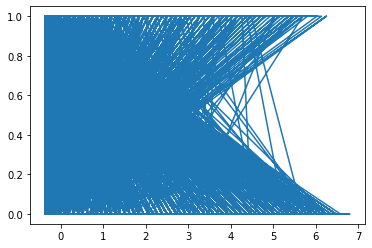

In [44]:
plt.plot(scaled_df['deposits'], y_train)

In [45]:
#sns.pairplot(new_data)

# Automated EDA

In [ ]:
!pip install dtale

In [47]:
import dtale
dtale.show(new_data)

http://cf3633c1e8b6:40000/dtale/main/1

In [48]:
dtale.show(scaled_df)

http://cf3633c1e8b6:40000/dtale/main/2

In [ ]:
# using Pandas-profiling
!pip install -U pandas-profiling

In [ ]:
# using SweetViz library
!pip install sweetviz

In [51]:
import sweetviz as sv
report = sv.analyze(new_data)
report.show_html('customer_stats.html')

                                             |          | [  0%]   00:00 -> (? left)

Report customer_stats.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [ ]:
# using Autoiviz for EDA
!pip install autoviz

In [53]:
from autoviz.AutoViz_Class import AutoViz_Class
Au = AutoViz_Class()

Imported v0.1.58. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine


Shape of your Data Set loaded: (26996, 33)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
user,24737,int64,0,0.000000,91.632094,0,
credit_score,8244,float64,0,0.000000,30.537857,0,
cc_recommended,325,int64,0,0.000000,1.203882,0,
purchases_partners,294,int64,0,0.000000,1.089050,0,
reward_rate,193,float64,0,0.000000,0.714921,0,
cc_application_begin,128,int64,0,0.000000,0.474144,0,
age,73,float64,0,0.000000,0.270410,0,skewed: cap or drop outliers
deposits,66,int64,0,0.000000,0.244481,0,
purchases,64,int64,0,0.000000,0.237072,0,
withdrawal,23,int64,0,0.000000,0.085198,0,


    33 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
3 numeric variables in data exceeds limit, taking top 30 variables
    List of variables selected: ['age', 'reward_rate', 'credit_score']
   Total columns > 30, too numerous to print.
Number of All Scatter Plots = 6
All Plots done
Time to run AutoViz = 10 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


,user,churn,age,deposits,withdrawal,purchases_partners,purchases,cc_taken,cc_recommended,cc_disliked,...,left_for_one_month,reward_rate,is_referred,R,na,Monthly,Semi-Monthly,Weekly,na_payment_type,credit_score
0,23547,0,28.0,0,0,1,0,0,96,0,...,0,1.47,1,1,0,0,0,1,0,486.000000
1,58313,0,35.0,47,2,86,47,0,285,0,...,0,2.17,0,1,0,0,1,0,0,561.000000
2,8095,0,26.0,26,3,38,25,0,74,0,...,0,1.10,1,1,0,0,0,0,0,567.000000
3,3120,1,32.0,5,3,111,5,0,227,0,...,0,1.83,0,1,0,0,0,0,0,567.000000
4,41406,0,21.0,0,0,4,0,0,0,0,...,0,0.07,0,0,1,0,0,0,0,475.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26991,19540,0,23.0,0,0,48,0,0,124,0,...,0,1.60,1,0,1,0,0,1,0,548.292360
26992,39792,0,24.0,0,0,62,0,0,136,0,...,0,1.60,0,1,0,0,0,0,0,551.397825
26993,49367,0,30.0,0,0,2,0,0,4,0,...,0,0.03,0,0,1,0,0,0,0,540.660274
26994,4116,1,26.0,0,0,2,0,0,1,0,...,0,0.67,0,0,1,0,0,0,0,551.827785


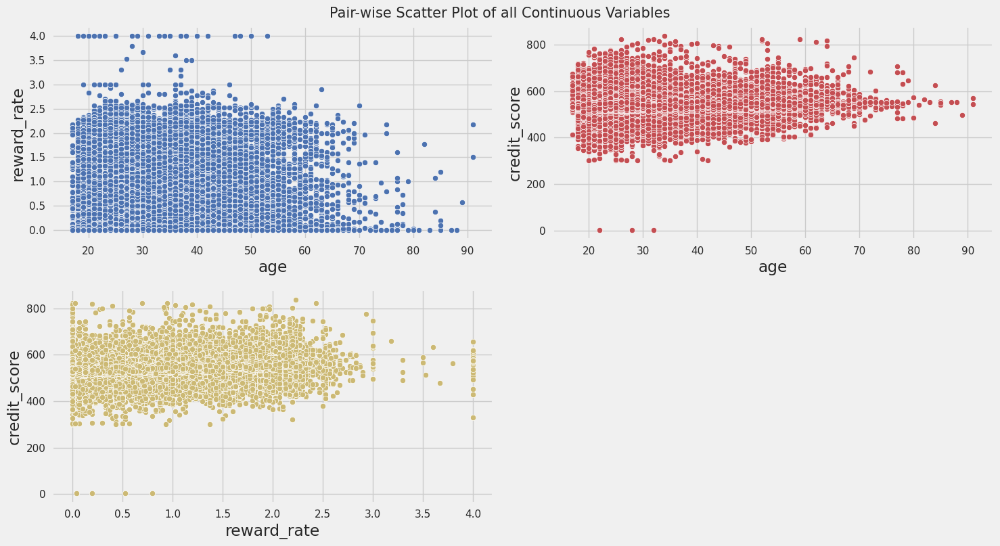

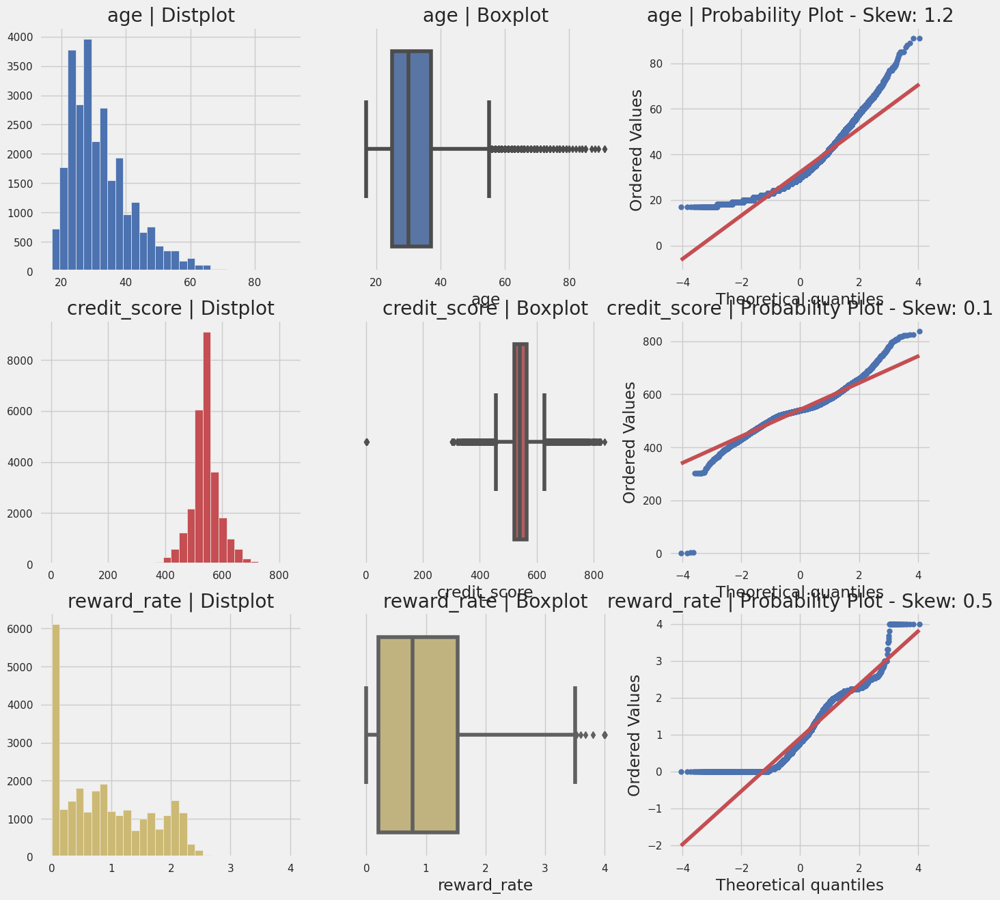

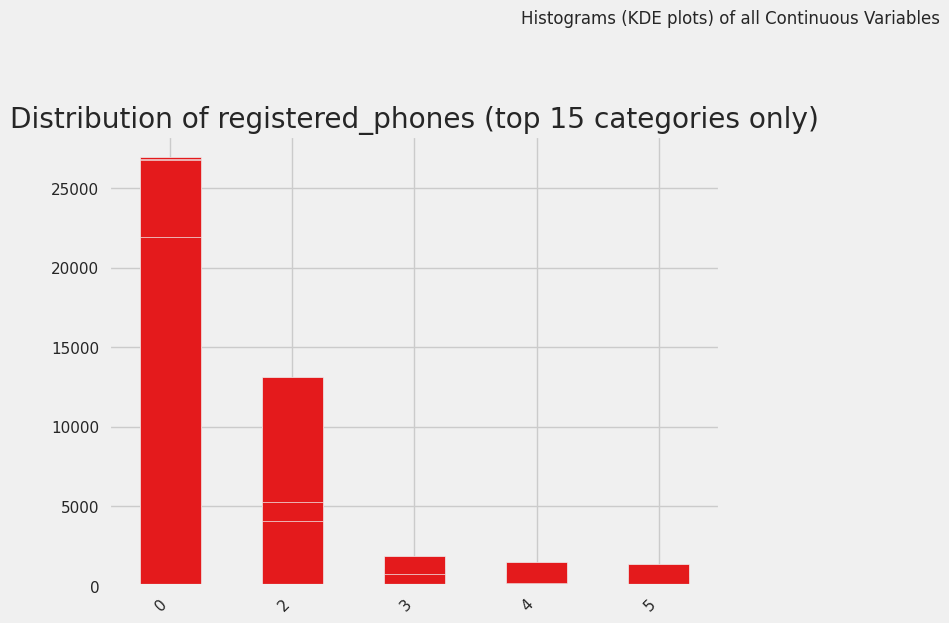

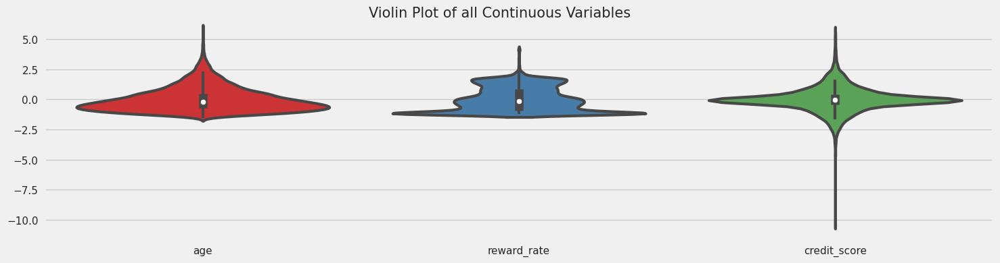

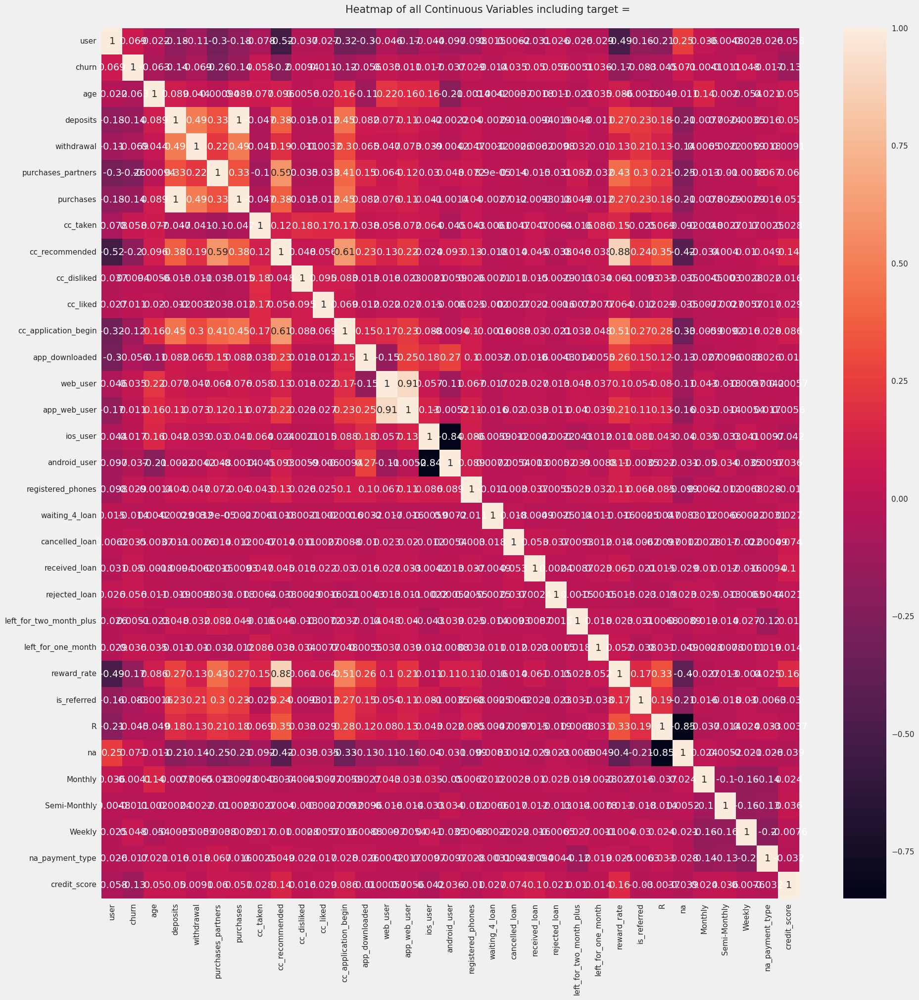

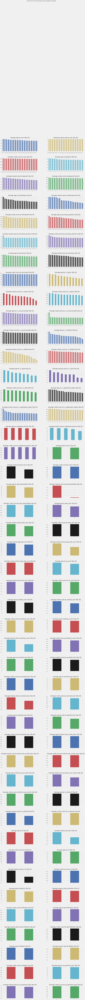

In [54]:
Au.AutoViz("credit_score_churn_data.csv")

## Model Creation

In [55]:
# use Random forest
from sklearn.ensemble import RandomForestClassifier
rfc_model = RandomForestClassifier(n_estimators=500,criterion='gini',max_depth=8)
rfc_model.fit(X_train,y_train)

RandomForestClassifier(max_depth=8, n_estimators=500)

In [56]:
y_pred = rfc_model.predict(X_test)

In [57]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.75      0.84      0.79      3169
           1       0.73      0.60      0.66      2231

    accuracy                           0.74      5400
   macro avg       0.74      0.72      0.73      5400
weighted avg       0.74      0.74      0.74      5400



In [58]:
print(confusion_matrix(y_test, y_pred))

[[2662  507]
 [ 888 1343]]


In [ ]:
# USING SMOTE to Handle Imbalanced data as we can see recall is less for the churners compared non-churners
!pip install imblearn

In [ ]:
!pip install imbalanced-learn

In [65]:
from imblearn.combine import SMOTETomek
sm = SMOTETomek(0.8)
X_train_res, y_train_res = sm.fit_resample(X_train, y_train)

In [66]:
rfc_model = RandomForestClassifier()
rfc_model.fit(X_train_res, y_train_res)

RandomForestClassifier()

In [67]:
y_pred = rfc_model.predict(X_test)

In [68]:
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.79      0.84      0.81      3169
           1       0.75      0.68      0.71      2231

    accuracy                           0.77      5400
   macro avg       0.77      0.76      0.76      5400
weighted avg       0.77      0.77      0.77      5400

[[2668  501]
 [ 719 1512]]


In [69]:
#Using SMOTENN
from imblearn.combine import SMOTEENN
sm = SMOTEENN(0.8)
X_train_res, y_train_res = sm.fit_resample(X_train, y_train)

In [70]:
rfc_model = RandomForestClassifier()
rfc_model.fit(X_train_res, y_train_res)

RandomForestClassifier()

In [71]:
y_pred = rfc_model.predict(X_test)
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.77      0.80      0.79      3169
           1       0.70      0.67      0.68      2231

    accuracy                           0.74      5400
   macro avg       0.74      0.73      0.73      5400
weighted avg       0.74      0.74      0.74      5400

[[2532  637]
 [ 746 1485]]


In [ ]:
# using XGBoost Algorithm
import xgboost as xgb
xgb_model = xgb.XGBClassifier(n_estimators=500,max_depth=8)
xgb_model.fit(X_train,y_train)

In [ ]:
y_pred = xgb_model.predict(X_test)

In [ ]:
print(classification_report(y_test, y_pred))

In [ ]:
print(confusion_matrix(y_test, y_pred))